# Práctica 18: 

Elaboró: Carlos Alejandro Jarero Gonzalez <al255813@alumnos.uacj.mx>

Matrícula: 255813

El presente Notebook fue relizado en equipo local con Kernel Python 3.11.8 en VS Code.

## Objetivos

El objetivo de esta actividad que el alumno haga un Exploratory Descriptive Analysis (EDA).

## Instrucciones de uso

Este notebook puede extraer datos del archivo ```AirQuality.csv```, para analizar la información presente.

Si quieres cambiar el archivo, o la dirección del mismo, solo ve a la sección de parameters y cambia el ```input_path```.

Puedes cambiar la random_state en ```random_state```.

### Si usas Google Colab

1. Ve a la sección de Files y asegurate de tener habilitado el acceso a tu Google Drive, de lo contrario hablitalo y dale los permisos correspondientes.
2. Si ya has realizado el paso anterior verás en tu notebook la siguiente instrucción de python para montar un volumen en el caso de linux ```/content/drive```, esto puede cambiar en diferentes sistemas operativos.
![Drive Mounting](./assets/DriveMount.png)
3. Asegurate de ejecutar la sección previa, dependidendo si ya has dado o no los permisos en este paso puede que de nuevo te solicite darle permiso. 
4. Ahora verás um directorio llamado drive donde encontarás tu Drive, ahí sube el archvio a procesar.
5. Copia el path absoluto de archivo de ```AirQuality.csv``` en ```input_path```.

## Descripción del conjunto de datos

Utiliza el conjunto de datos "Air Quality" disponible al final de esta practica. Este conjunto contiene datos horarios de sensores de calidad del aire, incluyendo niveles de CO, NOx, y otros contaminantes. El conjunto de datos tiene valores faltantes y columnas categóricas (por ejemplo, el día de la semana).

## Instrucciones para los estudiantes:

1. Descargar el archivo AirQuality.csv desde el enlace proporcionado.

In [167]:

import pandas as pd
import numpy as np
import seaborn as sns   
import matplotlib.pyplot as plt
import scipy.stats as stats 
from IPython.display import display, Markdown

pd.set_option("display.max_rows", 250)

input_path = ".data/AirQuality.csv"

random_state = 42

df = pd.read_csv(input_path, sep=";")

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


In [168]:
df.head(10)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN
5,10/03/2004,23.00.00,"1,2",1197.0,38.0,"4,7",750.0,89.0,1337.0,96.0,1393.0,949.0,"11,2","59,2","0,7848",NaN,NaN
6,11/03/2004,00.00.00,"1,2",1185.0,31.0,"3,6",690.0,62.0,1462.0,77.0,1333.0,733.0,"11,3","56,8","0,7603",NaN,NaN
7,11/03/2004,01.00.00,1,1136.0,31.0,"3,3",672.0,62.0,1453.0,76.0,1333.0,730.0,"10,7","60,0","0,7702",NaN,NaN
8,11/03/2004,02.00.00,"0,9",1094.0,24.0,"2,3",609.0,45.0,1579.0,60.0,1276.0,620.0,"10,7","59,7","0,7648",NaN,NaN
9,11/03/2004,03.00.00,"0,6",1010.0,19.0,"1,7",561.0,-200.0,1705.0,-200.0,1235.0,501.0,"10,3","60,2","0,7517",NaN,NaN


In [169]:
# Ajustamos los tipos de datos y nombres para falicitar el manejo.

df.columns = df.columns.str.lower()\
    .str.replace(")","")\
    .str.replace(r"[ .():]+", "_",regex=True)

df["date"] = pd.to_datetime(df["date"], format=r"%d/%m/%Y")
df["time"] = pd.to_datetime(df["time"], format=r"%H.%M.%S").dt.time # queda como object,no hay como tal un tipo de dato time, pero ya le damos el formato correcto.
df["co_gt"] = pd.to_numeric(df["co_gt"].str.replace(",","."))
df["pt08_s1_co"] = df["pt08_s1_co"].astype(float)
df["nmhc_gt"] = df["nmhc_gt"].astype(float)
df["c6h6_gt"] = df["c6h6_gt"].str.replace(",",".").astype(float)
df["pt08_s2_nmhc"] = df["pt08_s2_nmhc"].astype(float)
df["nox_gt"] = df["nox_gt"].astype(float)
df["pt08_s4_no2"] = df["pt08_s4_no2"].astype(float)
df["pt08_s5_o3"] = df["pt08_s5_o3"].astype(float)
df["t"] = df["t"].str.replace(",",".").astype(float)
df["rh"] = df["rh"].str.replace(",",".").astype(float)
df["ah"] = df["ah"].str.replace(",",".").astype(float)
df["unnamed_15"] = df["unnamed_15"].astype(object)
df["unnamed_16"] = df["unnamed_16"].astype(object)

# De unnamed_15 y unnamed_16, todas son nulas desconocemos el tipo.

df.head(10)

,date,time,co_gt,pt08_s1_co,nmhc_gt,c6h6_gt,pt08_s2_nmhc,nox_gt,pt08_s3_nox,no2_gt,pt08_s4_no2,pt08_s5_o3,t,rh,ah,unnamed_15,unnamed_16
0,2004-03-10,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,2004-03-10,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,2004-03-10,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,2004-03-10,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,2004-03-10,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN
5,2004-03-10,23:00:00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848,NaN,NaN
6,2004-03-11,00:00:00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603,NaN,NaN
7,2004-03-11,01:00:00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702,NaN,NaN
8,2004-03-11,02:00:00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648,NaN,NaN
9,2004-03-11,03:00:00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517,NaN,NaN


In [170]:
# Buscamos duplicados
print(df[df.duplicated()].head(10)) # todos son NaN

print(len(df[df.duplicated(keep=False)]))

     date time  co_gt  pt08_s1_co  nmhc_gt  c6h6_gt  pt08_s2_nmhc  nox_gt  \
9358  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9359  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9360  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9361  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9362  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9363  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9364  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9365  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9366  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   
9367  NaT  NaT    NaN         NaN      NaN      NaN           NaN     NaN   

      pt08_s3_nox  no2_gt  pt08_s4_no2  pt08_s5_o3   t  rh  ah unnamed_15  \
9358          NaN     NaN          NaN         NaN NaN NaN NaN        NaN  

Solo encontramos duplicados por la presencia de NaN, para fines del ejercicio los dejamoos y seguiremos con estos.

In [171]:
# Revisamos lo que queda para ser utilizado.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          9357 non-null   datetime64[ns]
 1   time          9357 non-null   object        
 2   co_gt         9357 non-null   float64       
 3   pt08_s1_co    9357 non-null   float64       
 4   nmhc_gt       9357 non-null   float64       
 5   c6h6_gt       9357 non-null   float64       
 6   pt08_s2_nmhc  9357 non-null   float64       
 7   nox_gt        9357 non-null   float64       
 8   pt08_s3_nox   9357 non-null   float64       
 9   no2_gt        9357 non-null   float64       
 10  pt08_s4_no2   9357 non-null   float64       
 11  pt08_s5_o3    9357 non-null   float64       
 12  t             9357 non-null   float64       
 13  rh            9357 non-null   float64       
 14  ah            9357 non-null   float64       
 15  unnamed_15    0 non-null      object  

2. Realizar un EDA completo, incluyendo:

- Descripción de los datos (medias, medianas, desviaciones estándar, etc.).

In [172]:
numeric_columns = df.select_dtypes(include=["float64"]).columns

df[numeric_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
co_gt,9357.0,-34.207524,77.657170,-200.0,0.6000,1.5000,2.6000,11.900
pt08_s1_co,9357.0,1048.990061,329.832710,-200.0,921.0000,1053.0000,1221.0000,2040.000
nmhc_gt,9357.0,-159.090093,139.789093,-200.0,-200.0000,-200.0000,-200.0000,1189.000
c6h6_gt,9357.0,1.865683,41.380206,-200.0,4.0000,7.9000,13.6000,63.700
pt08_s2_nmhc,9357.0,894.595276,342.333252,-200.0,711.0000,895.0000,1105.0000,2214.000
nox_gt,9357.0,168.616971,257.433866,-200.0,50.0000,141.0000,284.0000,1479.000
pt08_s3_nox,9357.0,794.990168,321.993552,-200.0,637.0000,794.0000,960.0000,2683.000
no2_gt,9357.0,58.148873,126.940455,-200.0,53.0000,96.0000,133.0000,340.000
pt08_s4_no2,9357.0,1391.479641,467.210125,-200.0,1185.0000,1446.0000,1662.0000,2775.000
pt08_s5_o3,9357.0,975.072032,456.938184,-200.0,700.0000,942.0000,1255.0000,2523.000


- Histogramas para las columnas numéricas.

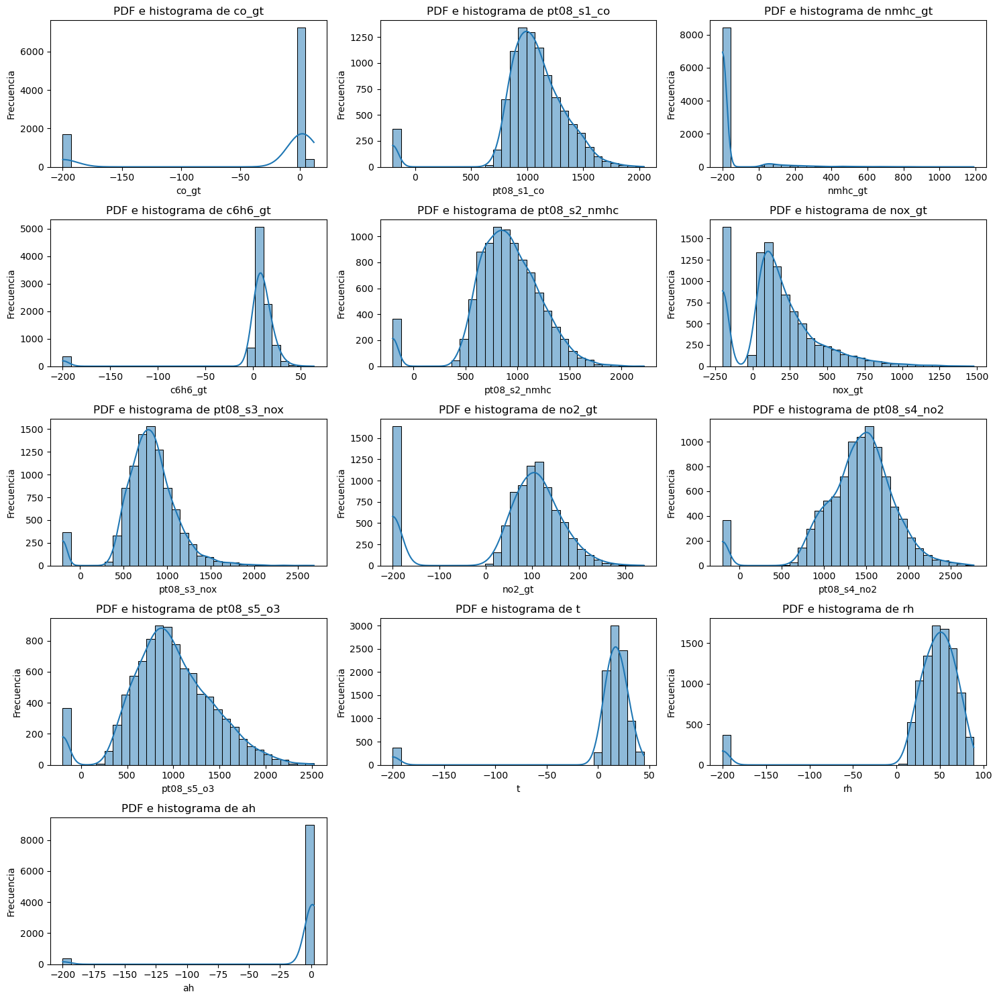

## Curtosis y sesgo

co_gt: Kurtosis=0.7783, Skewness=-1.6662

pt08_s1_co: Kurtosis=5.8369, Skewness=-1.7215

nmhc_gt: Kurtosis=18.8638, Skewness=4.0758

c6h6_gt: Kurtosis=19.1887, Skewness=-4.5088

pt08_s2_nmhc: Kurtosis=2.3701, Skewness=-0.7934

nox_gt: Kurtosis=1.5054, Skewness=0.8252

pt08_s3_nox: Kurtosis=3.1048, Skewness=-0.3848

no2_gt: Kurtosis=0.2756, Skewness=-1.2256

pt08_s4_no2: Kurtosis=3.2670, Skewness=-1.2441

pt08_s5_o3: Kurtosis=0.6383, Skewness=-0.0347

t: Kurtosis=18.7748, Skewness=-4.4455

rh: Kurtosis=15.7642, Skewness=-3.9324

ah: Kurtosis=20.6131, Skewness=-4.7546

In [173]:


plt.figure(figsize=(15, 15))

kws_display = ["## Curtosis y sesgo"]

for col in numeric_columns:
    plt.subplot(5, 3, np.where(numeric_columns == col)[0][0] + 1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"PDF e histograma de {col}", fontsize=12)
    plt.ylabel("Frecuencia", fontsize=10)
    plt.xlabel(col, fontsize=10)
    kws_display.append(f"{col}: Kurtosis={df[col].kurtosis():.4f}, Skewness={df[col].skew():.4f}")
    
plt.tight_layout()
plt.show()

for elm in kws_display:
    display(Markdown(elm))


- Gráficas de barras para las columnas categóricas (por ejemplo, DayOfWeek).

Primero no existe ningúna categórica ni llamada DayOfWeek, pero la podemos crear a partir de la fecha, la llamaremos day_week.

In [174]:
df["day_week"] = df["date"].dt.strftime("%A").astype("category")

# Validamos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          9357 non-null   datetime64[ns]
 1   time          9357 non-null   object        
 2   co_gt         9357 non-null   float64       
 3   pt08_s1_co    9357 non-null   float64       
 4   nmhc_gt       9357 non-null   float64       
 5   c6h6_gt       9357 non-null   float64       
 6   pt08_s2_nmhc  9357 non-null   float64       
 7   nox_gt        9357 non-null   float64       
 8   pt08_s3_nox   9357 non-null   float64       
 9   no2_gt        9357 non-null   float64       
 10  pt08_s4_no2   9357 non-null   float64       
 11  pt08_s5_o3    9357 non-null   float64       
 12  t             9357 non-null   float64       
 13  rh            9357 non-null   float64       
 14  ah            9357 non-null   float64       
 15  unnamed_15    0 non-null      object  

In [175]:
df["day_week"].value_counts()

day_week
Friday       1344
Saturday     1344
Sunday       1344
Thursday     1344
Monday       1335
Wednesday    1326
Tuesday      1320
Name: count, dtype: int64

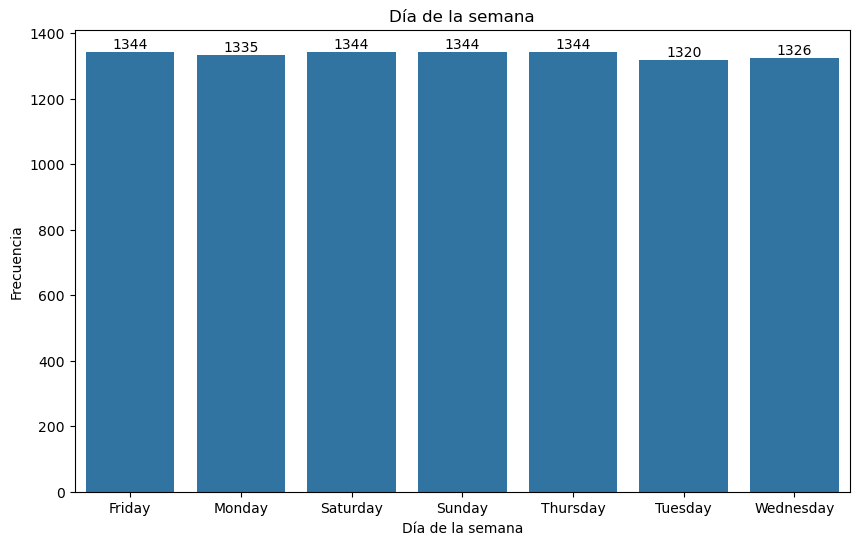

In [176]:
plt.figure(figsize=(10, 6))

gx = sns.barplot(df["day_week"].value_counts(), estimator="sum", errorbar=None)
plt.bar_label(gx.containers[0], fontsize=10)
plt.title("Día de la semana")
plt.xlabel("Día de la semana")
plt.ylabel("Frecuencia")

plt.show()


- Boxplots para identificar outliers en las columnas numéricas.

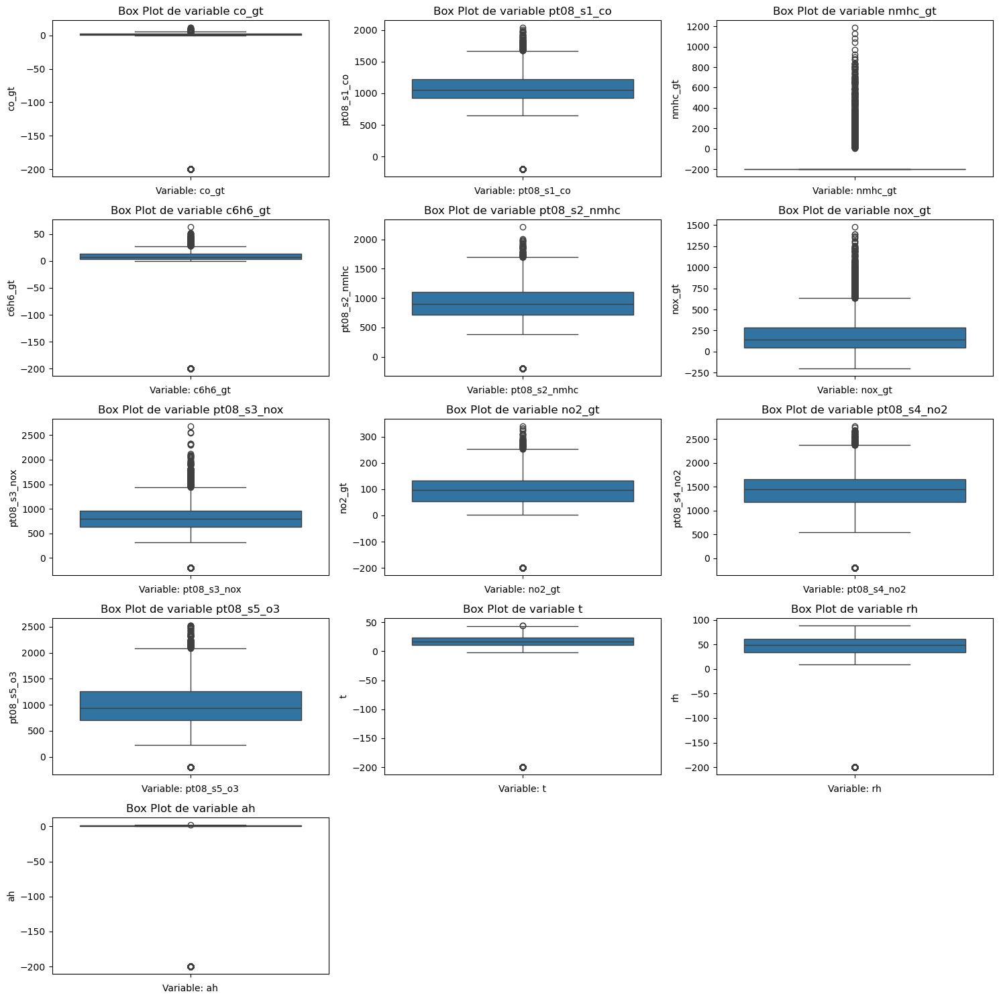

In [177]:
plt.figure(figsize=(15, 15))

for col in numeric_columns:
    plt.subplot(5, 3, np.where(numeric_columns == col)[0][0] + 1)
    sns.boxplot(y=col, data=df)
    plt.title(f"Box Plot de variable {col}", fontsize=12)
    plt.xlabel(f"Variable: {col}", fontsize=10)
    plt.ylabel(col, fontsize=10)
    
plt.tight_layout()
plt.show()


- Matriz de correlación y mapa de calor.

In [178]:
# Creamos la matriz de correlación primero
matrix_corr = df[numeric_columns].corr(method="spearman")

matrix_corr

,co_gt,pt08_s1_co,nmhc_gt,c6h6_gt,pt08_s2_nmhc,nox_gt,pt08_s3_nox,no2_gt,pt08_s4_no2,pt08_s5_o3,t,rh,ah
co_gt,1.000000,0.584303,0.136404,0.589675,0.589660,0.813398,-0.580009,0.770475,0.304593,0.575858,-0.070522,-0.043470,-0.113679
pt08_s1_co,0.584303,1.000000,0.132093,0.901943,0.901952,0.507425,-0.645027,0.475732,0.685713,0.906212,0.184913,0.194736,0.235418
nmhc_gt,0.136404,0.132093,1.000000,0.027654,0.027701,-0.037532,0.161023,0.021889,0.119579,0.024717,-0.095652,0.011119,-0.157001
c6h6_gt,0.589675,0.901943,0.027654,1.000000,0.999986,0.479695,-0.641706,0.456964,0.776905,0.888051,0.357331,0.004280,0.282890
pt08_s2_nmhc,0.589660,0.901952,0.027701,0.999986,1.000000,0.479659,-0.641697,0.456908,0.776904,0.888063,0.357277,0.004289,0.282844
nox_gt,0.813398,0.507425,-0.037532,0.479695,0.479659,1.000000,-0.580659,0.906417,0.066173,0.551341,-0.262647,0.058493,-0.243340
pt08_s3_nox,-0.580009,-0.645027,0.161023,-0.641706,-0.641697,-0.580659,1.000000,-0.521751,-0.362894,-0.652411,0.007710,0.038280,-0.080139
no2_gt,0.770475,0.475732,0.021889,0.456964,0.456908,0.906417,-0.521751,1.000000,0.060535,0.497793,-0.203430,-0.133815,-0.329867
pt08_s4_no2,0.304593,0.685713,0.119579,0.776905,0.776904,0.066173,-0.362894,0.060535,1.000000,0.610442,0.657941,0.053909,0.685177
pt08_s5_o3,0.575858,0.906212,0.024717,0.888051,0.888063,0.551341,-0.652411,0.497793,0.610442,1.000000,0.110878,0.226369,0.186709


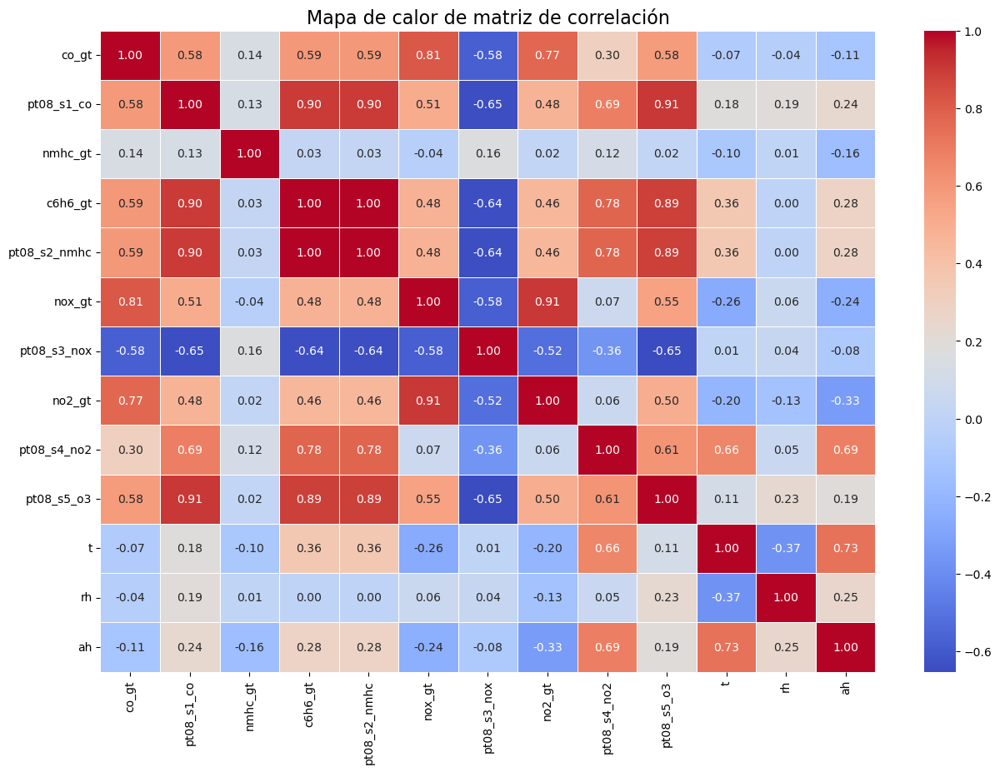

In [179]:
# Ahora el mapa de calor
plt.figure(figsize=(15, 10))
sns.heatmap(matrix_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Mapa de calor de matriz de correlación", fontsize=16)

plt.show()


- Pairplot para visualizar relaciones entre variables numéricas.

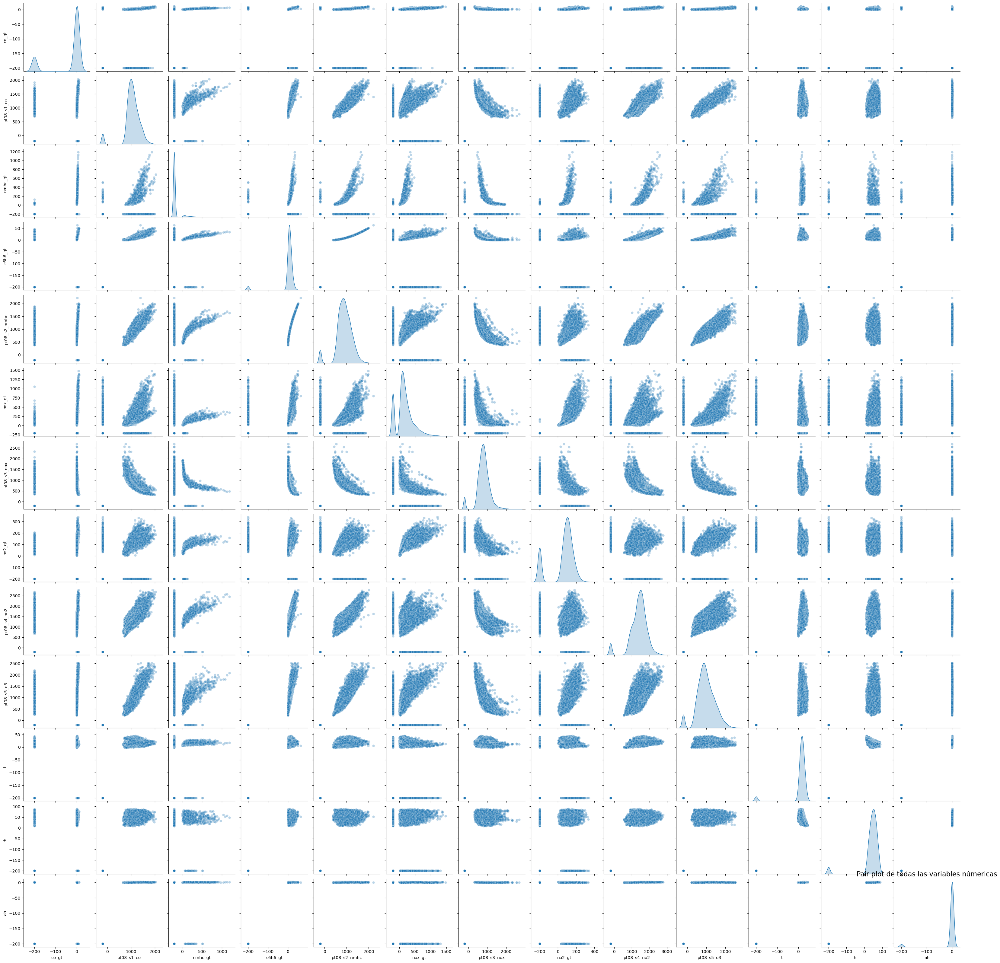

In [180]:
sns.pairplot(df[numeric_columns], plot_kws={"alpha": 0.3}, diag_kind="kde")
plt.title("Pair plot de todas las variables númericas", fontsize=16)

plt.show()


- Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

## Pruebas de normalidad

### Variable co_gt

-------------------------------------------------------------------------------------------------------


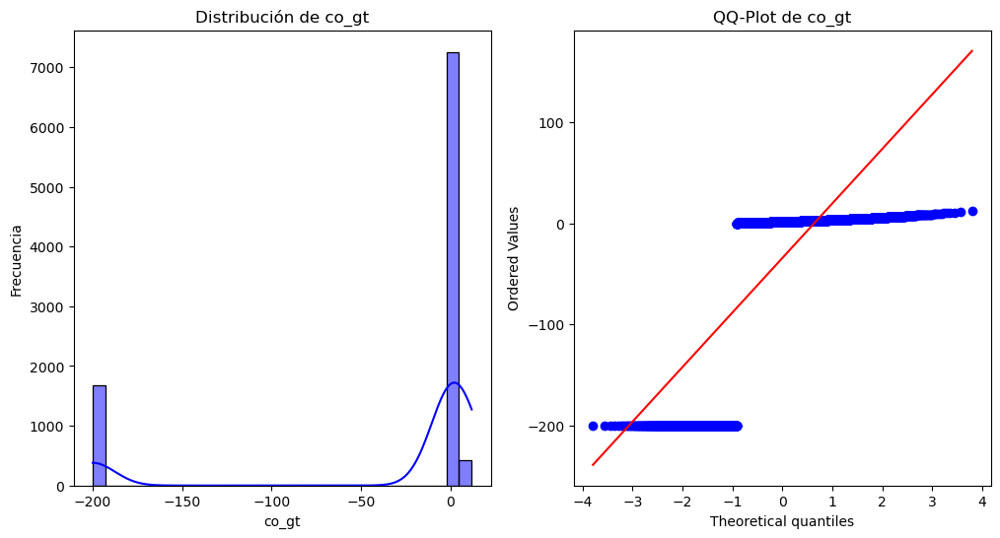

Prueba de Normalidad para: co_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.48493, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 2501.15334
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.49629, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
____________

### Variable pt08_s1_co

-------------------------------------------------------------------------------------------------------


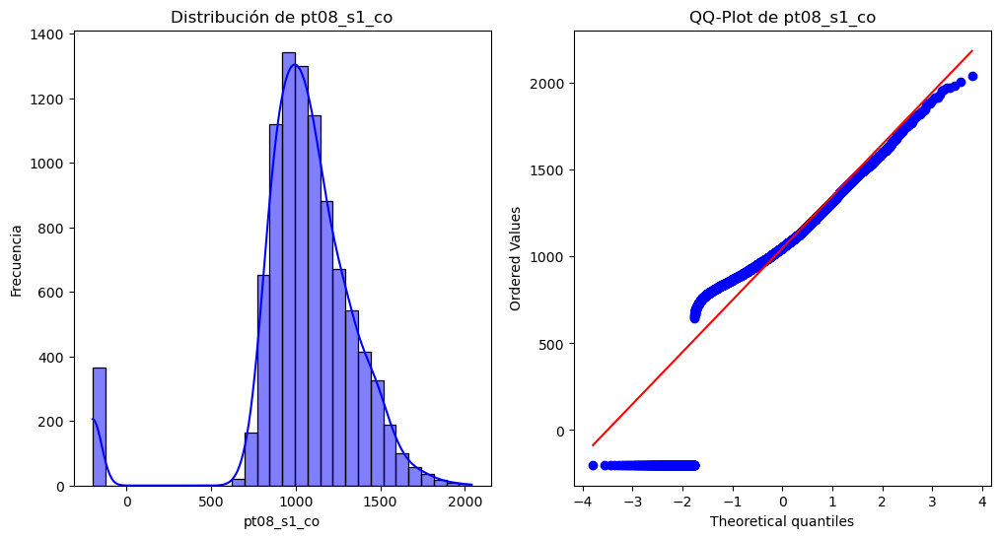

Prueba de Normalidad para: pt08_s1_co
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.82855, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 355.41246
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
________

### Variable nmhc_gt

-------------------------------------------------------------------------------------------------------


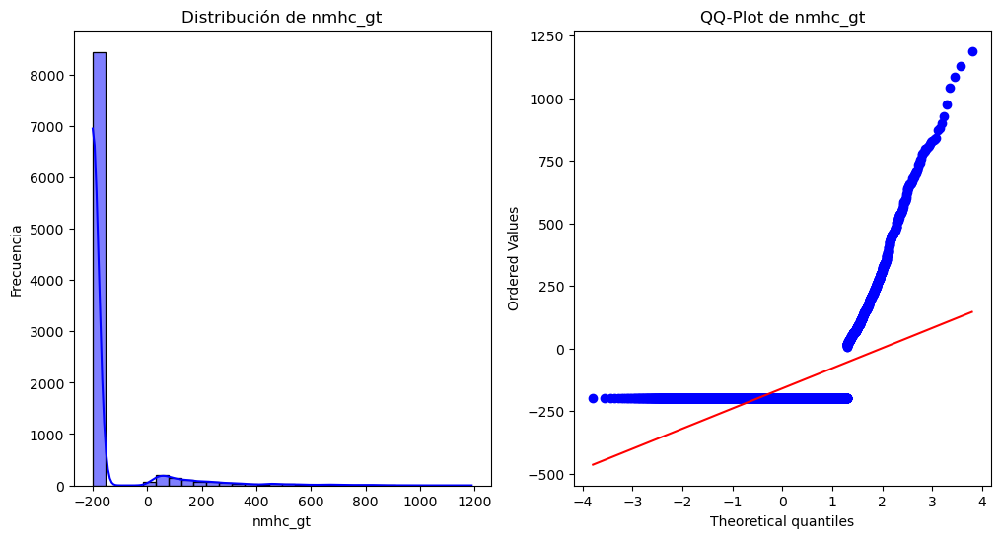

Prueba de Normalidad para: nmhc_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.34681, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 2820.94917
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.90232, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
__________

### Variable c6h6_gt

-------------------------------------------------------------------------------------------------------


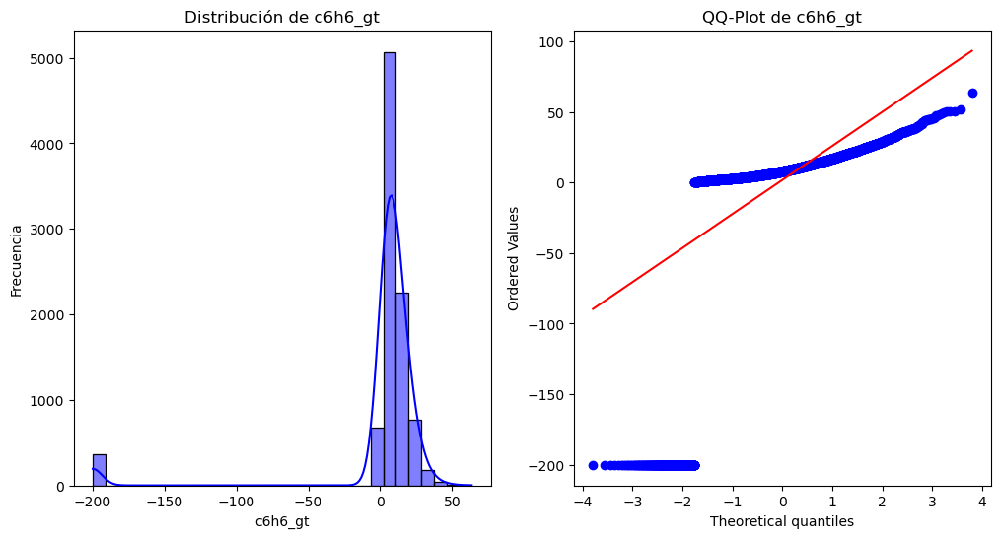

Prueba de Normalidad para: c6h6_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.33897, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 2272.58484
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.87797, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
__________

### Variable pt08_s2_nmhc

-------------------------------------------------------------------------------------------------------


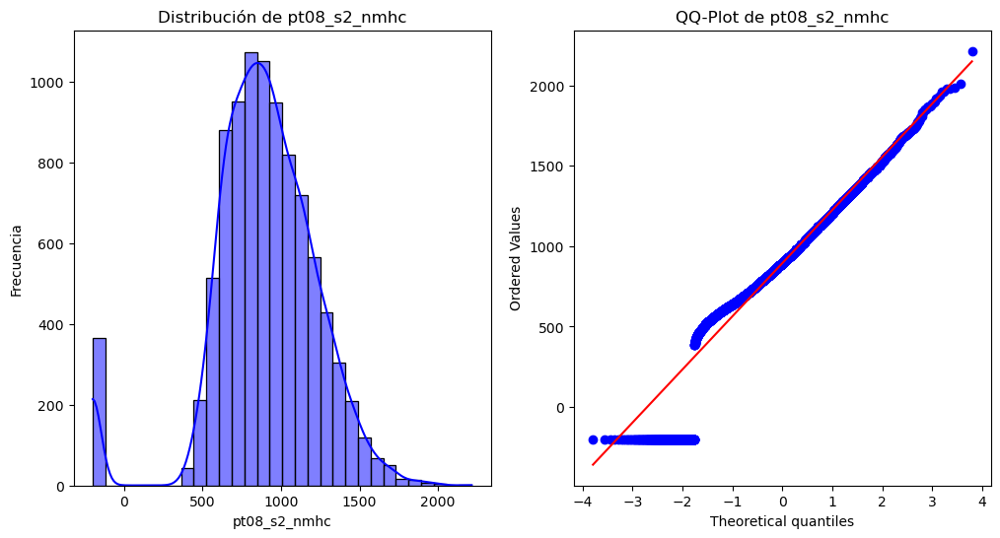

Prueba de Normalidad para: pt08_s2_nmhc
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.93415, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 119.20819
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
______

### Variable nox_gt

-------------------------------------------------------------------------------------------------------


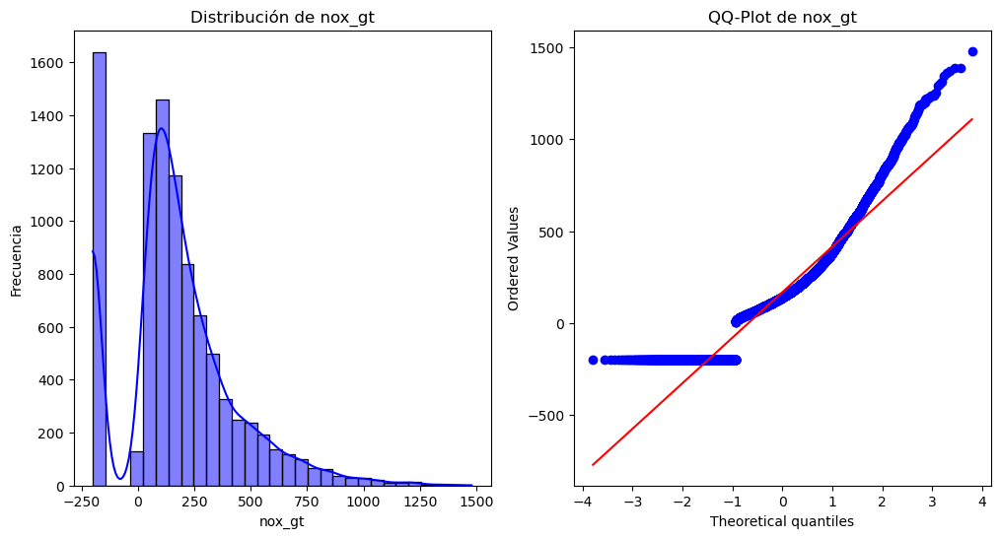

Prueba de Normalidad para: nox_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.92127, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 188.79429
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.82470, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
____________

### Variable pt08_s3_nox

-------------------------------------------------------------------------------------------------------


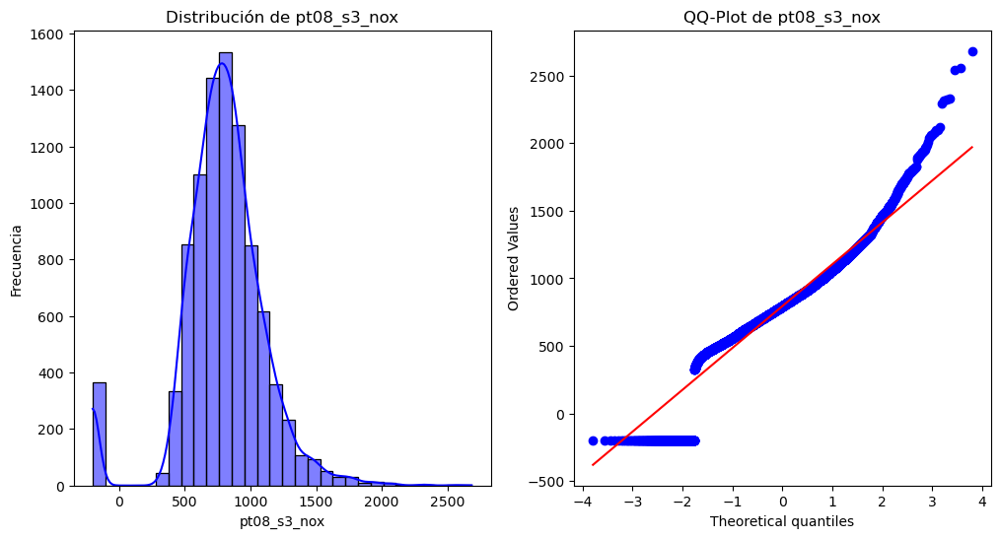

Prueba de Normalidad para: pt08_s3_nox
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.92644, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 159.03112
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_______

### Variable no2_gt

-------------------------------------------------------------------------------------------------------


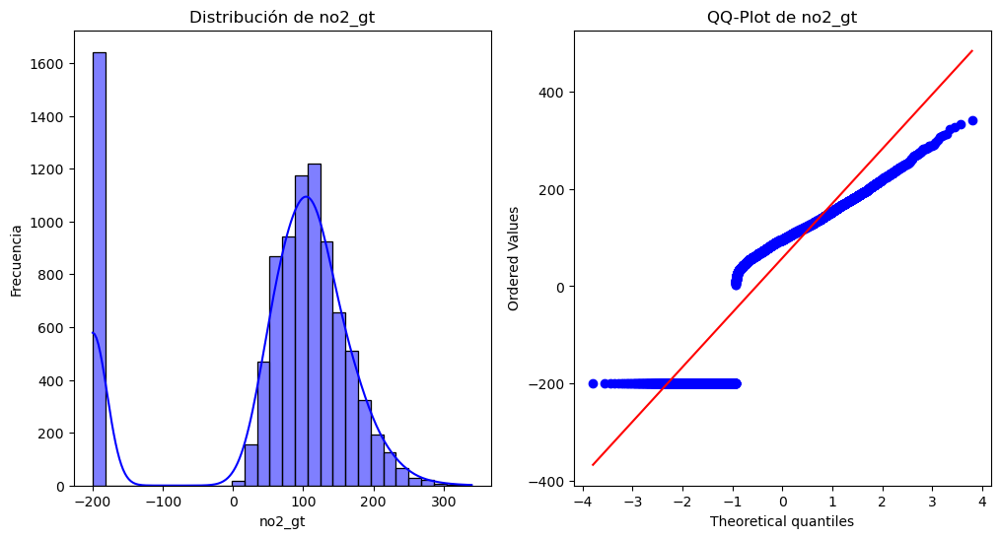

Prueba de Normalidad para: no2_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.77606, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 894.66163
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.82430, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
____________

### Variable pt08_s4_no2

-------------------------------------------------------------------------------------------------------


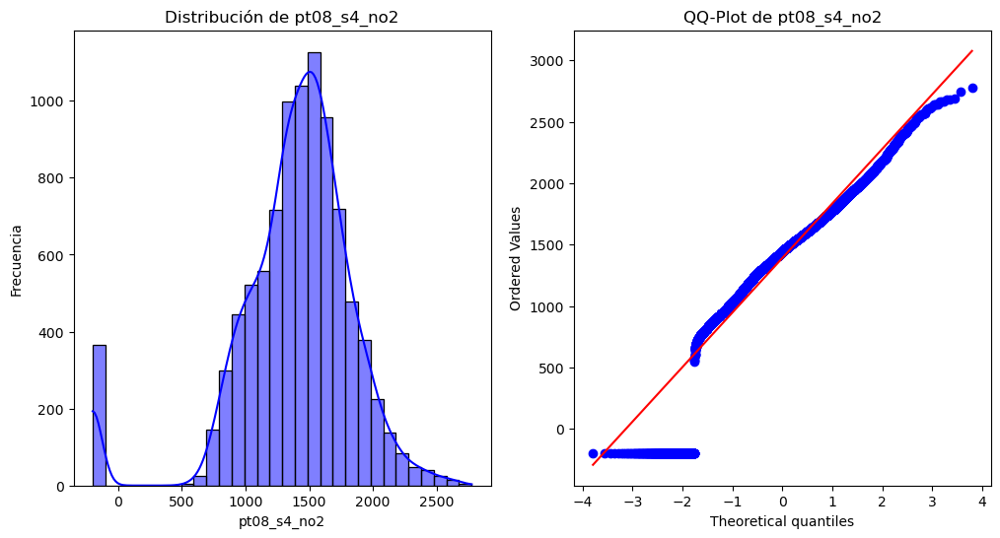

Prueba de Normalidad para: pt08_s4_no2
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.90615, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 183.34158
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_______

### Variable pt08_s5_o3

-------------------------------------------------------------------------------------------------------


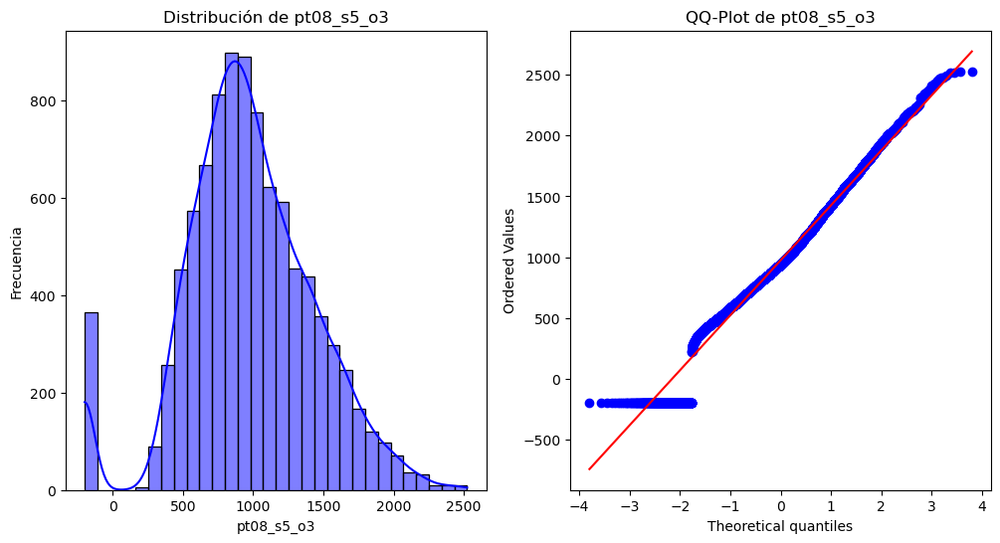

Prueba de Normalidad para: pt08_s5_o3
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.97988, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 45.68234
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_________

### Variable t

-------------------------------------------------------------------------------------------------------


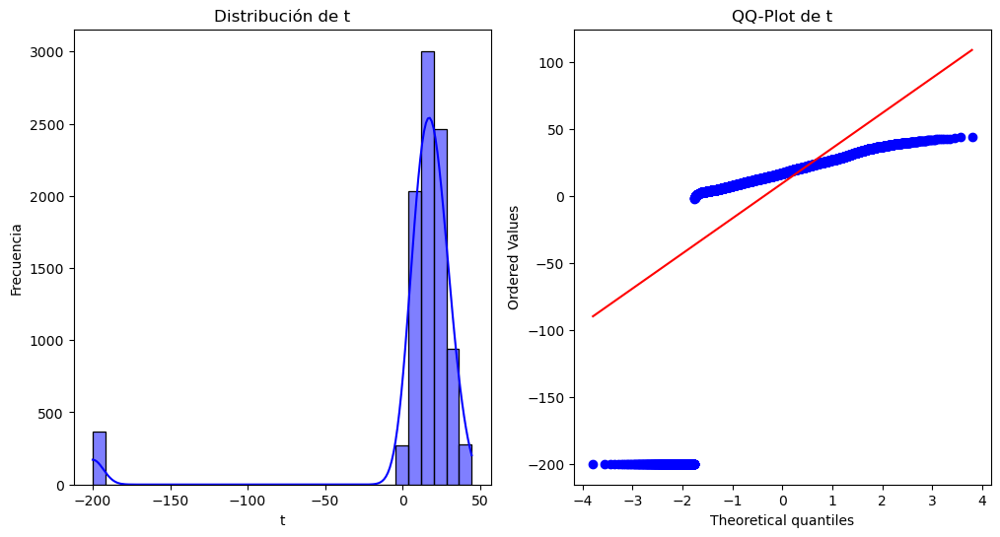

Prueba de Normalidad para: t
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.36594, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 2041.45858
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.94583, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
________________

### Variable rh

-------------------------------------------------------------------------------------------------------


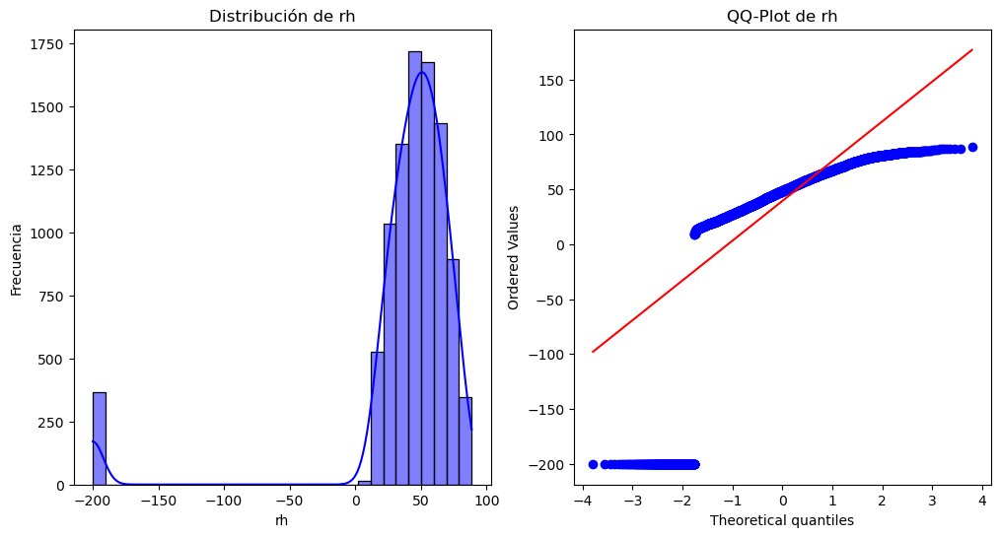

Prueba de Normalidad para: rh
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.50101, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 1329.04460
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.96088, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_______________

### Variable ah

-------------------------------------------------------------------------------------------------------


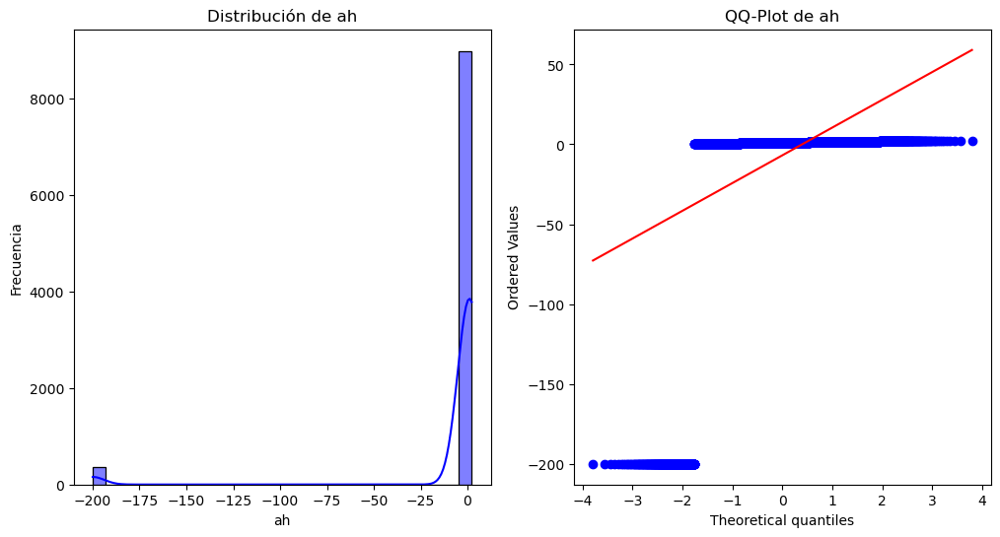

Prueba de Normalidad para: ah
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.19281, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 3357.68062
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.57380, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_______________

In [181]:
SE_RECHAZA_H0 = "Se rechaza la H0"
NO_SE_RECHAZA_H0 = "No se rechaza la H0"

display(Markdown("## Pruebas de normalidad"))
for column in numeric_columns:
    display(Markdown(f"### Variable {column}"))
    print("-------------------------------------------------------------------------------------------------------")
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df[column].dropna(), kde=True, color="blue", bins=30)
    plt.title(f'Distribución de {column}', fontsize=12)
    plt.ylabel("Frecuencia", fontsize=10)
    plt.xlabel(column, fontsize=10)
    
    plt.subplot(1, 2, 2)
    stats.probplot(df[column].dropna(), dist="norm", plot=plt)
    plt.title(f'QQ-Plot de {column}', fontsize=12)
    
    plt.show()
    
    print(f"Prueba de Normalidad para: {column}")
    
    stest = stats.shapiro(df[column].dropna().sample(min(5000, len(df[column])), random_state=random_state)) # se limita a 5000 por warning de librería
    print(f"\tPrueba de Shapiro-Wilk (p<=0.05): p-value: {stest.pvalue:.5f}, valor: {stest.statistic:.5f}, evaluación: {SE_RECHAZA_H0 if stest.pvalue <= 0.05 else NO_SE_RECHAZA_H0}") 
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    atest = stats.anderson(df[column].dropna(), dist='norm')
    print(f"\tPrueba de Anderson-Darling: valor: {atest.statistic:.5f}")
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    for i in range(len(atest.critical_values)):
        sl, cv = atest.significance_level[i], atest.critical_values[i]
        if atest.statistic < cv:
            print(f"\t\t\tAl nivel de significancia aplha de {sl}%, los datos parecen normales.")
        else:
            print(f"\t\t\tAl nivel de significancia aplha de {sl}%, los datos NO parecen normales.")
    
    ktest = stats.kstest(df[column].dropna(), 'norm')
    print(f"\tPrueba de Kolmogorov-Smirnov (p<=0.05): p-value: {ktest.pvalue:.5f}, valor: {ktest.statistic:.5f}, evaluación: , evaluación: {SE_RECHAZA_H0 if ktest.pvalue <= 0.05 else NO_SE_RECHAZA_H0}")
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    print("_______________________________________________________________________________________________________")

3. Identificar y tratar los datos faltantes utilizando técnicas como imputación por media, mediana o moda, o eliminación de filas/columnas según sea apropiado.

In [182]:
# Eliminamos las columnas vacias
remove_empty_columns = [
    "unnamed_15",
    "unnamed_16"
]

df = df.drop(columns=remove_empty_columns)

df.head(10)

,date,time,co_gt,pt08_s1_co,nmhc_gt,c6h6_gt,pt08_s2_nmhc,nox_gt,pt08_s3_nox,no2_gt,pt08_s4_no2,pt08_s5_o3,t,rh,ah,day_week
0,2004-03-10,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,Wednesday
1,2004-03-10,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,Wednesday
2,2004-03-10,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,Wednesday
3,2004-03-10,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,Wednesday
4,2004-03-10,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,Wednesday
5,2004-03-10,23:00:00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848,Wednesday
6,2004-03-11,00:00:00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603,Thursday
7,2004-03-11,01:00:00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702,Thursday
8,2004-03-11,02:00:00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648,Thursday
9,2004-03-11,03:00:00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517,Thursday


In [183]:
df = df[~df.duplicated(keep=False)] # Arriba notamos que los NaN son filas vacias igual se observa en csv, por lo tanto no mantenemos nada. 

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          9357 non-null   datetime64[ns]
 1   time          9357 non-null   object        
 2   co_gt         9357 non-null   float64       
 3   pt08_s1_co    9357 non-null   float64       
 4   nmhc_gt       9357 non-null   float64       
 5   c6h6_gt       9357 non-null   float64       
 6   pt08_s2_nmhc  9357 non-null   float64       
 7   nox_gt        9357 non-null   float64       
 8   pt08_s3_nox   9357 non-null   float64       
 9   no2_gt        9357 non-null   float64       
 10  pt08_s4_no2   9357 non-null   float64       
 11  pt08_s5_o3    9357 non-null   float64       
 12  t             9357 non-null   float64       
 13  rh            9357 non-null   float64       
 14  ah            9357 non-null   float64       
 15  day_week      9357 non-null   category     

In [184]:
df.head(25)

,date,time,co_gt,pt08_s1_co,nmhc_gt,c6h6_gt,pt08_s2_nmhc,nox_gt,pt08_s3_nox,no2_gt,pt08_s4_no2,pt08_s5_o3,t,rh,ah,day_week
0,2004-03-10,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,Wednesday
1,2004-03-10,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,Wednesday
2,2004-03-10,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,Wednesday
3,2004-03-10,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,Wednesday
4,2004-03-10,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,Wednesday
5,2004-03-10,23:00:00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848,Wednesday
6,2004-03-11,00:00:00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603,Thursday
7,2004-03-11,01:00:00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702,Thursday
8,2004-03-11,02:00:00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648,Thursday
9,2004-03-11,03:00:00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517,Thursday


In [185]:
# En el origen del DataSet encontramos que el valor -200 es un NAN

# Contamos los nan marcados con -200
df[numeric_columns].isin([-200]).sum()

co_gt           1683
pt08_s1_co       366
nmhc_gt         8443
c6h6_gt          366
pt08_s2_nmhc     366
nox_gt          1639
pt08_s3_nox      366
no2_gt          1642
pt08_s4_no2      366
pt08_s5_o3       366
t                366
rh               366
ah               366
dtype: int64

In [186]:
# Los retiramos
df[numeric_columns] = df[numeric_columns].replace(-200,np.nan)

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          9357 non-null   datetime64[ns]
 1   time          9357 non-null   object        
 2   co_gt         7674 non-null   float64       
 3   pt08_s1_co    8991 non-null   float64       
 4   nmhc_gt       914 non-null    float64       
 5   c6h6_gt       8991 non-null   float64       
 6   pt08_s2_nmhc  8991 non-null   float64       
 7   nox_gt        7718 non-null   float64       
 8   pt08_s3_nox   8991 non-null   float64       
 9   no2_gt        7715 non-null   float64       
 10  pt08_s4_no2   8991 non-null   float64       
 11  pt08_s5_o3    8991 non-null   float64       
 12  t             8991 non-null   float64       
 13  rh            8991 non-null   float64       
 14  ah            8991 non-null   float64       
 15  day_week      9357 non-null   category     

In [187]:
df.isna().sum()/len(df)*100 

date             0.000000
time             0.000000
co_gt           17.986534
pt08_s1_co       3.911510
nmhc_gt         90.231912
c6h6_gt          3.911510
pt08_s2_nmhc     3.911510
nox_gt          17.516298
pt08_s3_nox      3.911510
no2_gt          17.548360
pt08_s4_no2      3.911510
pt08_s5_o3       3.911510
t                3.911510
rh               3.911510
ah               3.911510
day_week         0.000000
dtype: float64

In [188]:
# Se observa que nmhc_gt tiene más del 20% de valores perdidos, se va a descartar.
df = df.drop(columns=["nmhc_gt"])

# actualizamos las columnas numéricas
numeric_columns = df.select_dtypes(include=["float64"]).columns

In [189]:
for col in numeric_columns:
    df[col] = df[col].ffill()
    
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          9357 non-null   datetime64[ns]
 1   time          9357 non-null   object        
 2   co_gt         9357 non-null   float64       
 3   pt08_s1_co    9357 non-null   float64       
 4   c6h6_gt       9357 non-null   float64       
 5   pt08_s2_nmhc  9357 non-null   float64       
 6   nox_gt        9357 non-null   float64       
 7   pt08_s3_nox   9357 non-null   float64       
 8   no2_gt        9357 non-null   float64       
 9   pt08_s4_no2   9357 non-null   float64       
 10  pt08_s5_o3    9357 non-null   float64       
 11  t             9357 non-null   float64       
 12  rh            9357 non-null   float64       
 13  ah            9357 non-null   float64       
 14  day_week      9357 non-null   category      
dtypes: category(1), datetime64[ns](1), float64(

# 4. Repetir el EDA después del tratamiento de datos faltantes y comparar los resultados.

2a. Realizar un EDA completo, incluyendo:

- Descripción de los datos (medias, medianas, desviaciones estándar, etc.).

In [190]:
df[numeric_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
co_gt,9357.0,2.082195,1.469801,0.1000,1.0000,1.7000,2.8000,11.900
pt08_s1_co,9357.0,1102.730362,219.588101,647.0000,938.0000,1062.0000,1237.0000,2040.000
c6h6_gt,9357.0,10.190392,7.565771,0.1000,4.4000,8.3000,14.0000,63.700
pt08_s2_nmhc,9357.0,942.548253,269.581368,383.0000,733.0000,911.0000,1117.0000,2214.000
nox_gt,9357.0,240.731217,206.618453,2.0000,97.0000,174.0000,318.0000,1479.000
pt08_s3_nox,9357.0,832.742225,255.709423,322.0000,655.0000,807.0000,968.0000,2683.000
no2_gt,9357.0,109.414877,47.221662,2.0000,73.0000,102.0000,137.0000,340.000
pt08_s4_no2,9357.0,1453.014535,347.434084,551.0000,1228.0000,1460.0000,1677.0000,2775.000
pt08_s5_o3,9357.0,1030.511916,410.916759,221.0000,726.0000,964.0000,1287.0000,2523.000
t,9357.0,18.317356,8.821883,-1.9000,11.9000,17.6000,24.3000,44.600


- Histogramas para las columnas numéricas.

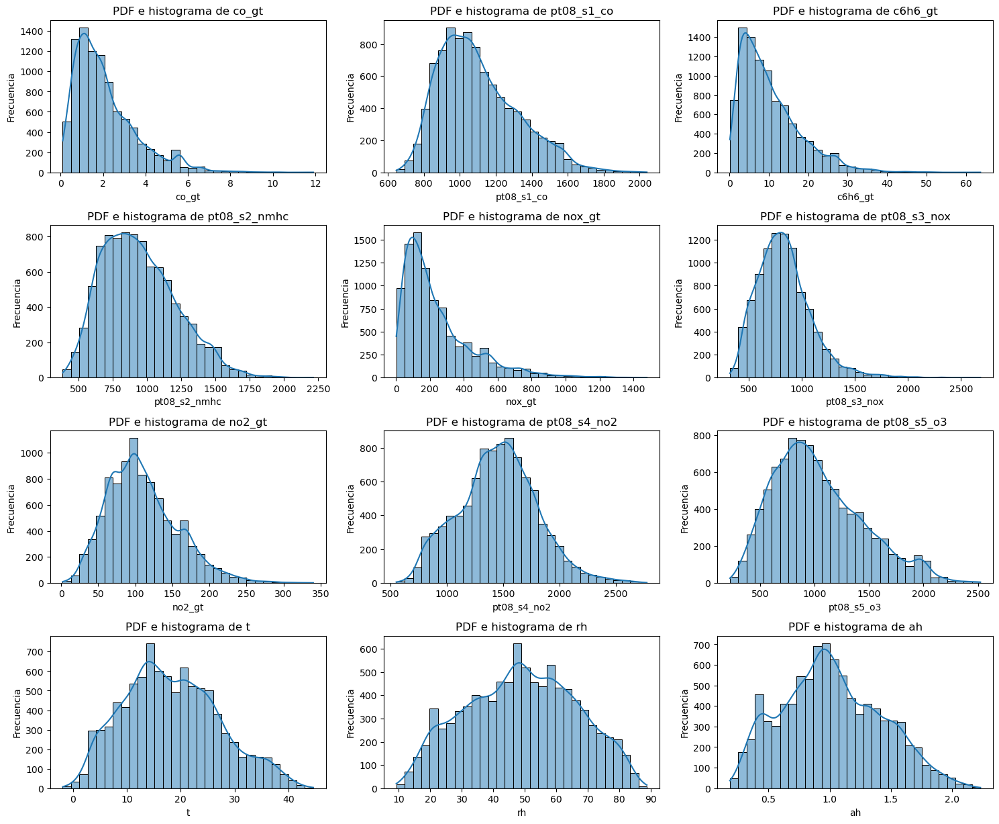

## Curtosis y sesgo

co_gt: Kurtosis=2.4365, Skewness=1.3960

pt08_s1_co: Kurtosis=0.2260, Skewness=0.7457

c6h6_gt: Kurtosis=2.2171, Skewness=1.3335

pt08_s2_nmhc: Kurtosis=0.0012, Skewness=0.5683

nox_gt: Kurtosis=3.3971, Skewness=1.6929

pt08_s3_nox: Kurtosis=2.6458, Skewness=1.0761

no2_gt: Kurtosis=0.5558, Skewness=0.7002

pt08_s4_no2: Kurtosis=0.0449, Skewness=0.1736

pt08_s5_o3: Kurtosis=0.0056, Skewness=0.6625

t: Kurtosis=-0.4488, Skewness=0.3246

rh: Kurtosis=-0.8056, Skewness=-0.0342

ah: Kurtosis=-0.5596, Skewness=0.2481

In [191]:

plt.figure(figsize=(15, 15))

kws_display = ["## Curtosis y sesgo"]

for col in numeric_columns:
    plt.subplot(5, 3, np.where(numeric_columns == col)[0][0] + 1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"PDF e histograma de {col}", fontsize=12)
    plt.ylabel("Frecuencia", fontsize=10)
    plt.xlabel(col, fontsize=10)
    kws_display.append(f"{col}: Kurtosis={df[col].kurtosis():.4f}, Skewness={df[col].skew():.4f}")
    
plt.tight_layout()
plt.show()

for elm in kws_display:
    display(Markdown(elm))

- Gráficas de barras para las columnas categóricas (por ejemplo, DayOfWeek).

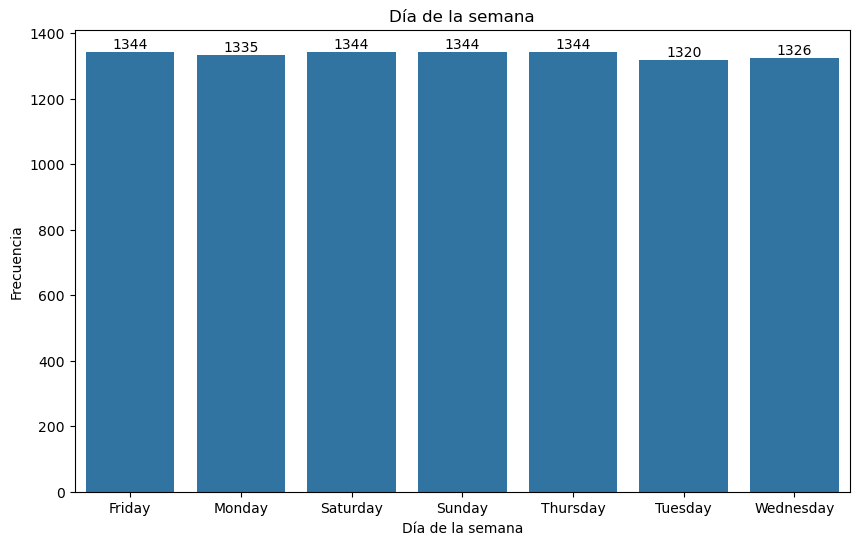

In [192]:
plt.figure(figsize=(10, 6))

gx = sns.barplot(df["day_week"].value_counts(), estimator="sum", errorbar=None)
plt.bar_label(gx.containers[0], fontsize=10)
plt.title("Día de la semana")
plt.xlabel("Día de la semana")
plt.ylabel("Frecuencia")

plt.show()

- Boxplots para identificar outliers en las columnas numéricas.

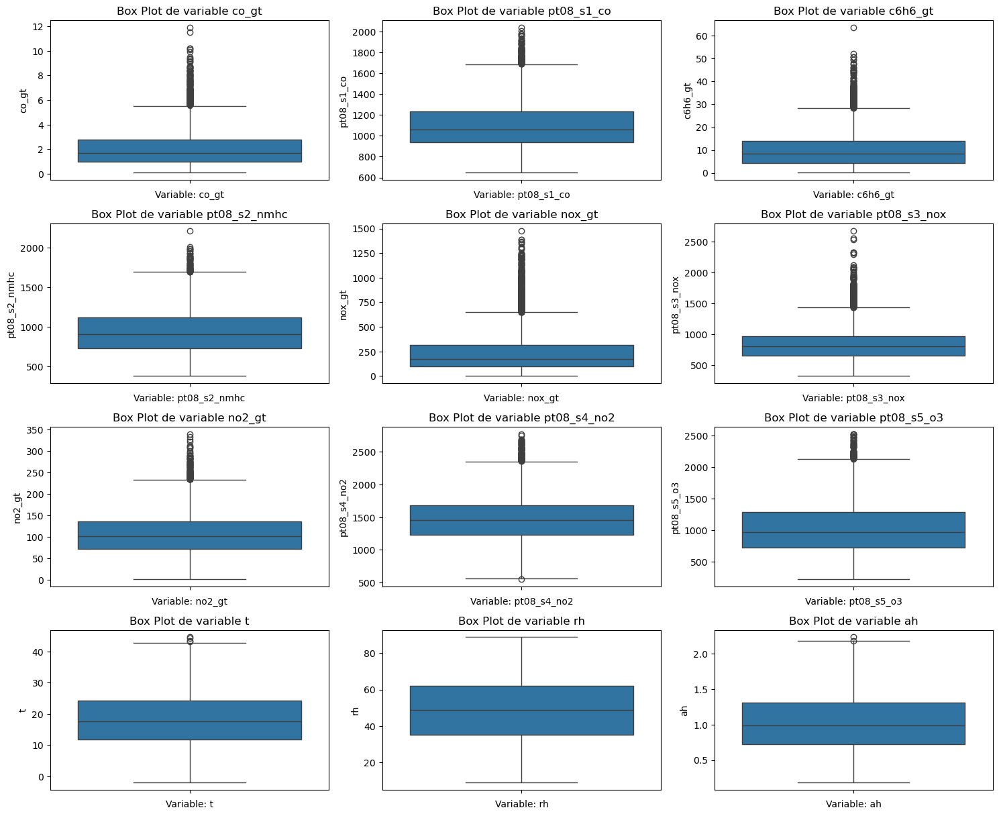

In [193]:
plt.figure(figsize=(15, 15))

for col in numeric_columns:
    plt.subplot(5, 3, np.where(numeric_columns == col)[0][0] + 1)
    sns.boxplot(y=col, data=df)
    plt.title(f"Box Plot de variable {col}", fontsize=12)
    plt.xlabel(f"Variable: {col}", fontsize=10)
    plt.ylabel(col, fontsize=10)
    
plt.tight_layout()
plt.show()

- Matriz de correlación y mapa de calor.

In [194]:
matrix_corr = df[numeric_columns].corr(method="spearman")

matrix_corr

,co_gt,pt08_s1_co,c6h6_gt,pt08_s2_nmhc,nox_gt,pt08_s3_nox,no2_gt,pt08_s4_no2,pt08_s5_o3,t,rh,ah
co_gt,1.000000,0.768056,0.786849,0.786838,0.754859,-0.704236,0.733141,0.486140,0.743813,0.043289,-0.016672,0.013079
pt08_s1_co,0.768056,1.000000,0.893449,0.893439,0.647041,-0.857991,0.615514,0.644658,0.897345,0.070486,0.100609,0.124176
c6h6_gt,0.786849,0.893449,1.000000,0.999983,0.627229,-0.853130,0.595749,0.747383,0.875031,0.265347,-0.110094,0.180605
pt08_s2_nmhc,0.786838,0.893439,0.999983,1.000000,0.627188,-0.853123,0.595675,0.747402,0.875002,0.265350,-0.110126,0.180617
nox_gt,0.754859,0.647041,0.627229,0.627188,1.000000,-0.717130,0.814342,0.125543,0.708389,-0.256501,0.154110,-0.177738
pt08_s3_nox,-0.704236,-0.857991,-0.853130,-0.853123,-0.717130,1.000000,-0.621143,-0.537293,-0.864019,-0.105084,-0.092762,-0.201232
no2_gt,0.733141,0.615514,0.595749,0.595675,0.814342,-0.621143,1.000000,0.115571,0.640120,-0.195719,-0.118694,-0.332092
pt08_s4_no2,0.486140,0.644658,0.747383,0.747402,0.125543,-0.537293,0.115571,1.000000,0.560393,0.611329,-0.053303,0.640412
pt08_s5_o3,0.743813,0.897345,0.875031,0.875002,0.708389,-0.864019,0.640120,0.560393,1.000000,-0.014047,0.145038,0.072980
t,0.043289,0.070486,0.265347,0.265350,-0.256501,-0.105084,-0.195719,0.611329,-0.014047,1.000000,-0.534192,0.701882


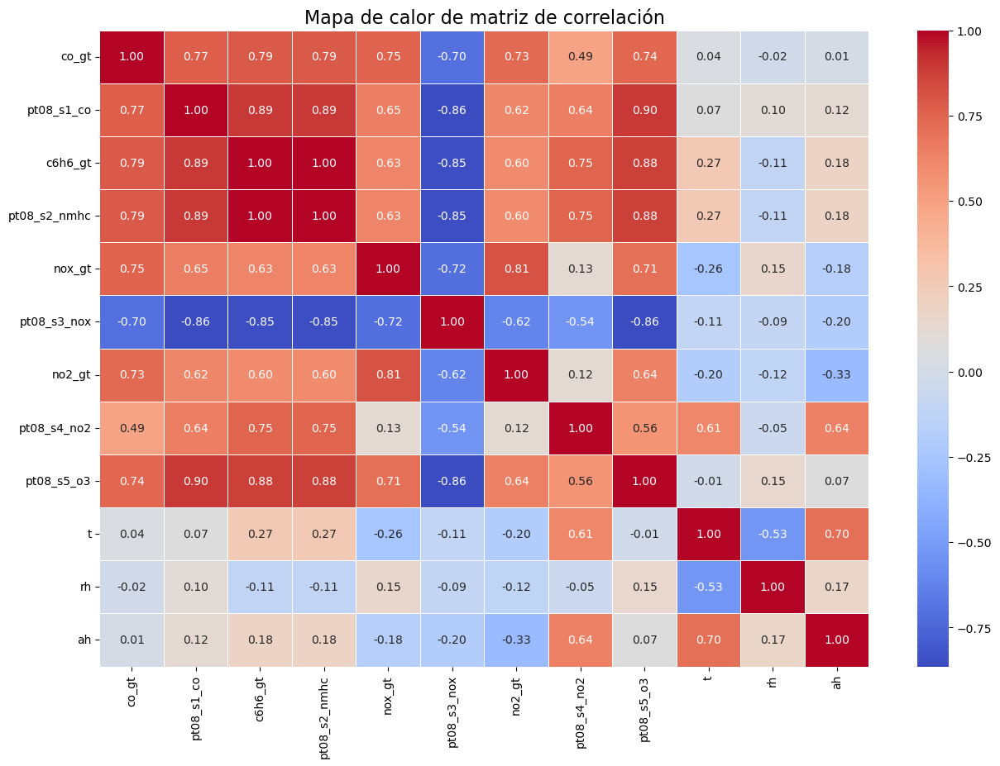

In [195]:
# Ahora el mapa de calor
plt.figure(figsize=(15, 10))
sns.heatmap(matrix_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Mapa de calor de matriz de correlación", fontsize=16)

plt.show()

- Pairplot para visualizar relaciones entre variables numéricas.

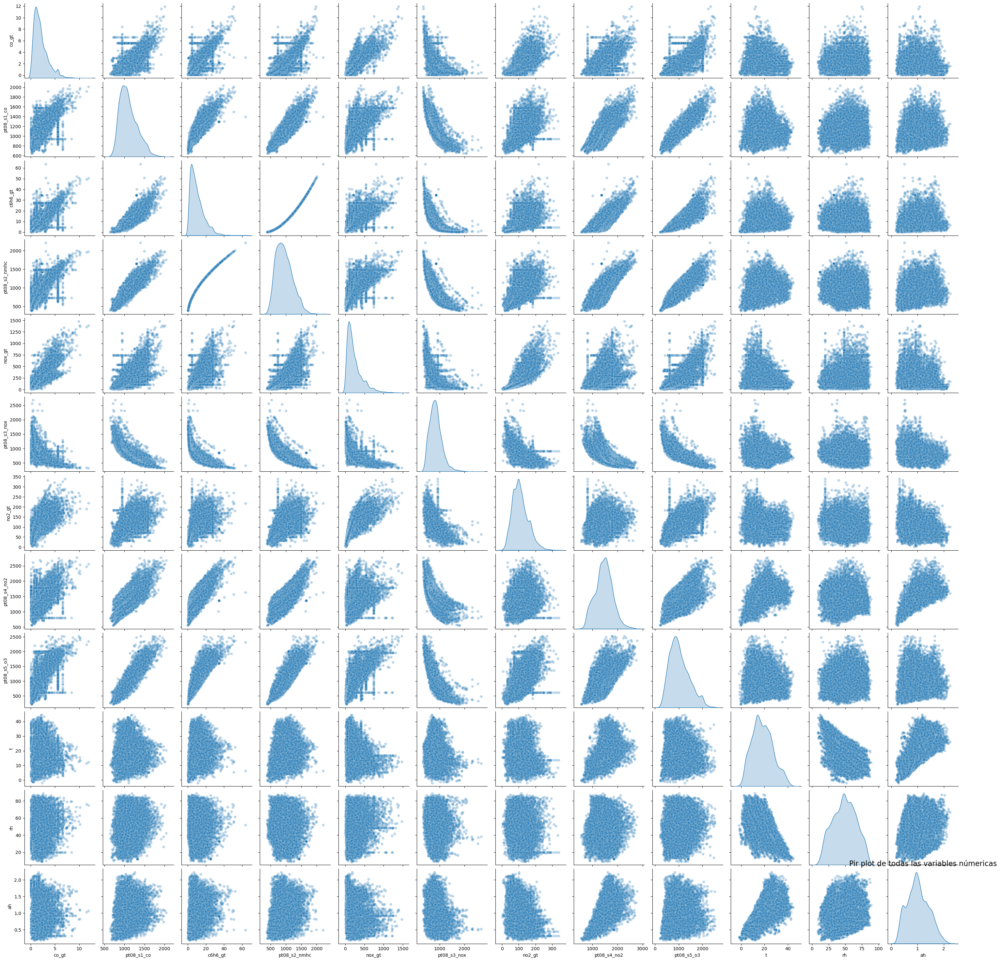

In [196]:
sns.pairplot(df[numeric_columns], plot_kws={"alpha": 0.3}, diag_kind="kde")
plt.title("Pir plot de todas las variables númericas", fontsize=16)

plt.show()

- Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

## Pruebas de normalidad

### Variable co_gt

-------------------------------------------------------------------------------------------------------


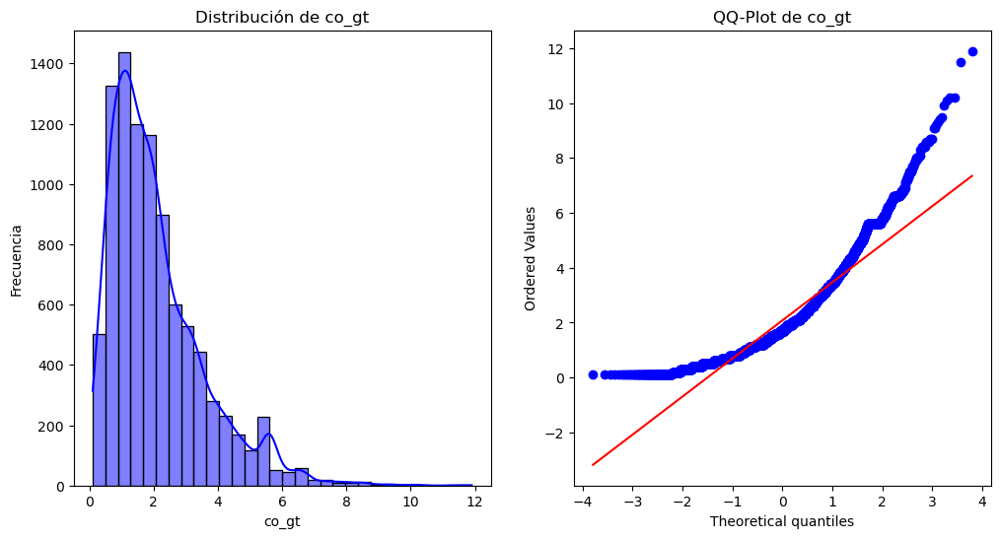

Prueba de Normalidad para: co_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.88458, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 270.15197
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.64657, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_____________

### Variable pt08_s1_co

-------------------------------------------------------------------------------------------------------


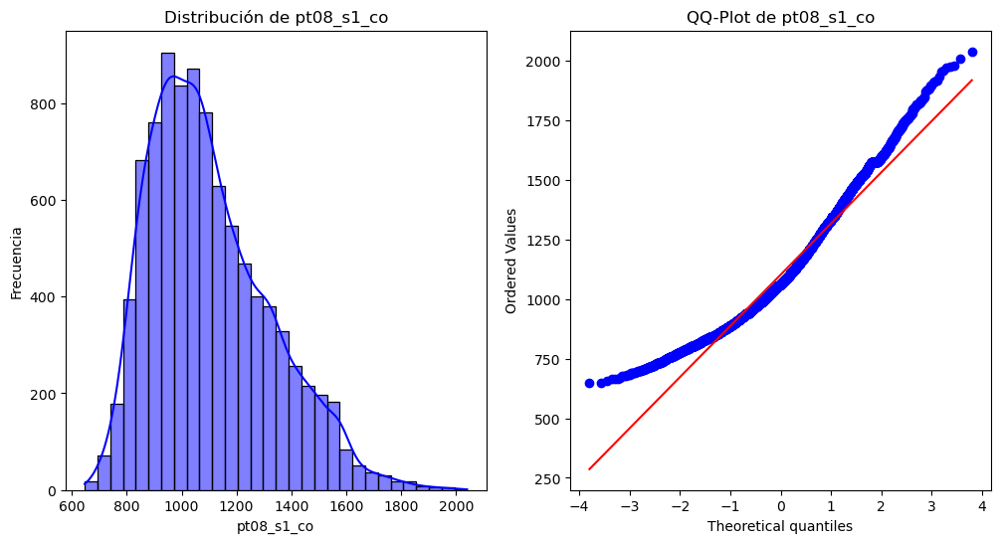

Prueba de Normalidad para: pt08_s1_co
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.95855, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 107.37861
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
________

### Variable c6h6_gt

-------------------------------------------------------------------------------------------------------


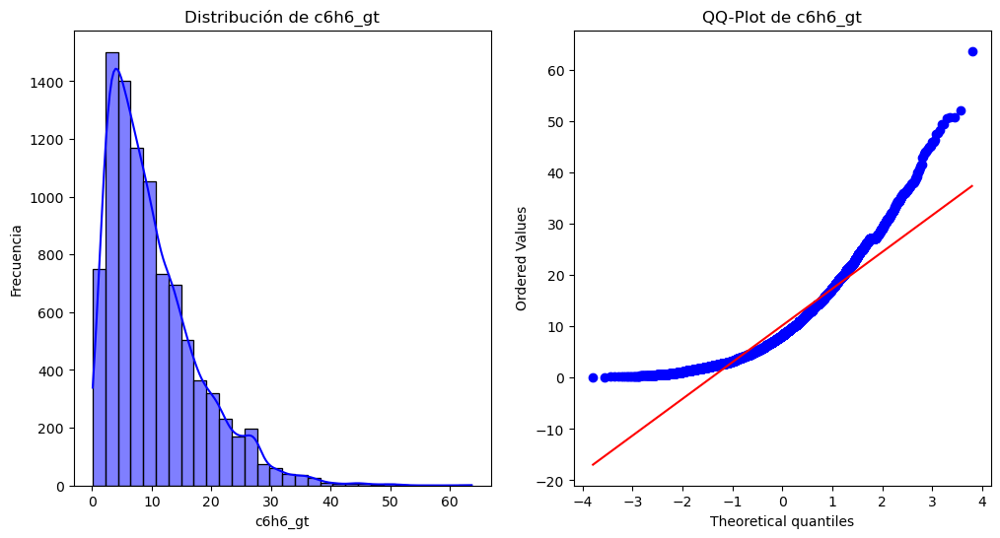

Prueba de Normalidad para: c6h6_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.89209, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 252.46697
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.91708, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
___________

### Variable pt08_s2_nmhc

-------------------------------------------------------------------------------------------------------


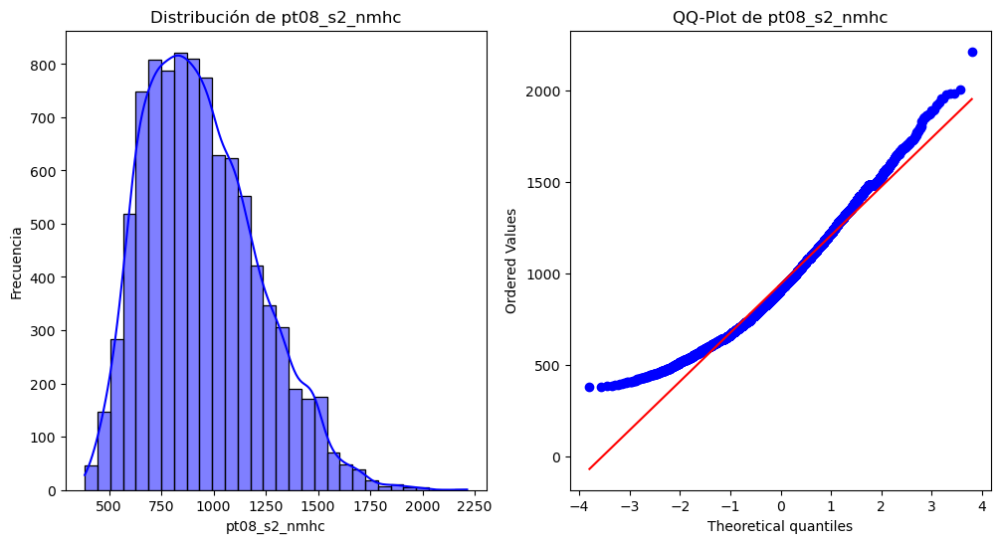

Prueba de Normalidad para: pt08_s2_nmhc
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.97459, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 56.67177
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_______

### Variable nox_gt

-------------------------------------------------------------------------------------------------------


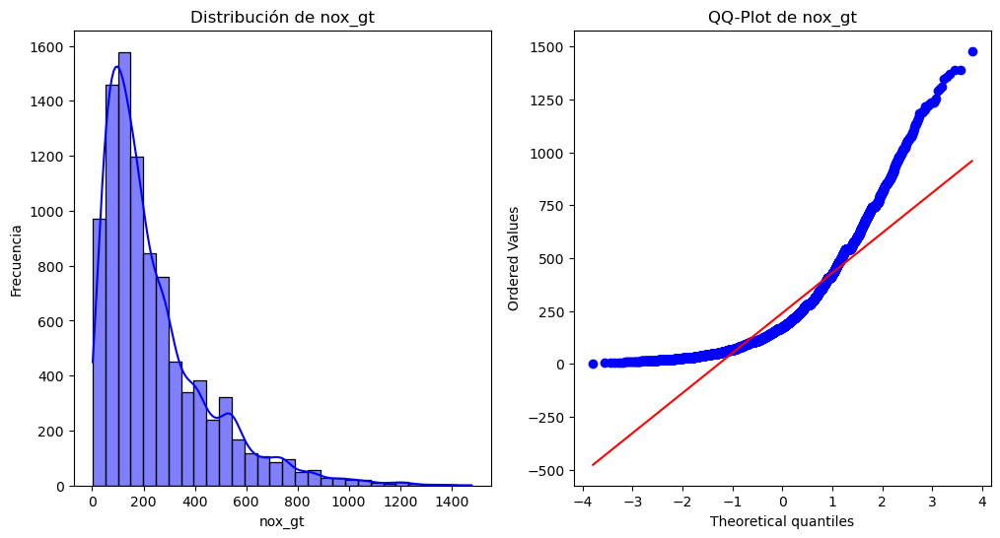

Prueba de Normalidad para: nox_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.83637, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 422.77585
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.99986, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
____________

### Variable pt08_s3_nox

-------------------------------------------------------------------------------------------------------


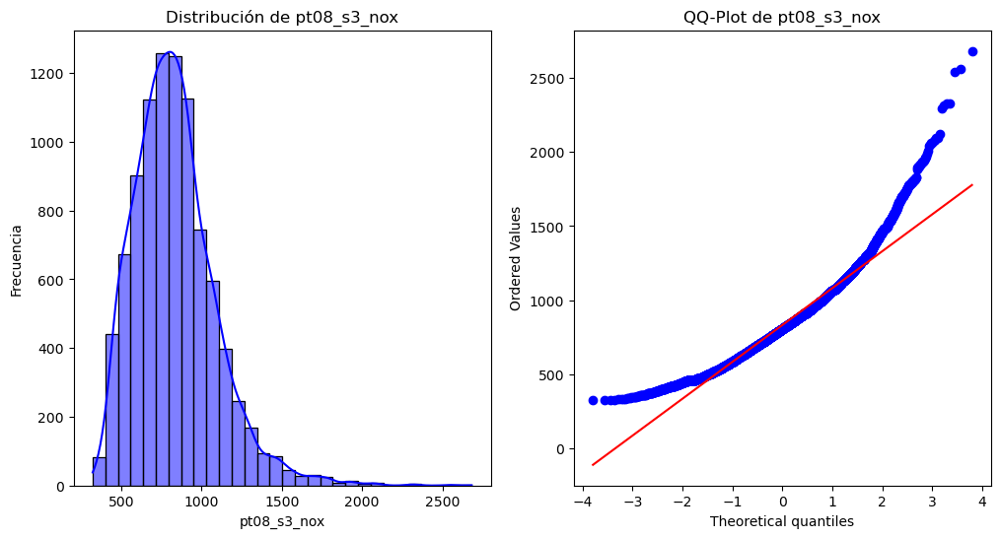

Prueba de Normalidad para: pt08_s3_nox
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.94993, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 70.75704
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
________

### Variable no2_gt

-------------------------------------------------------------------------------------------------------


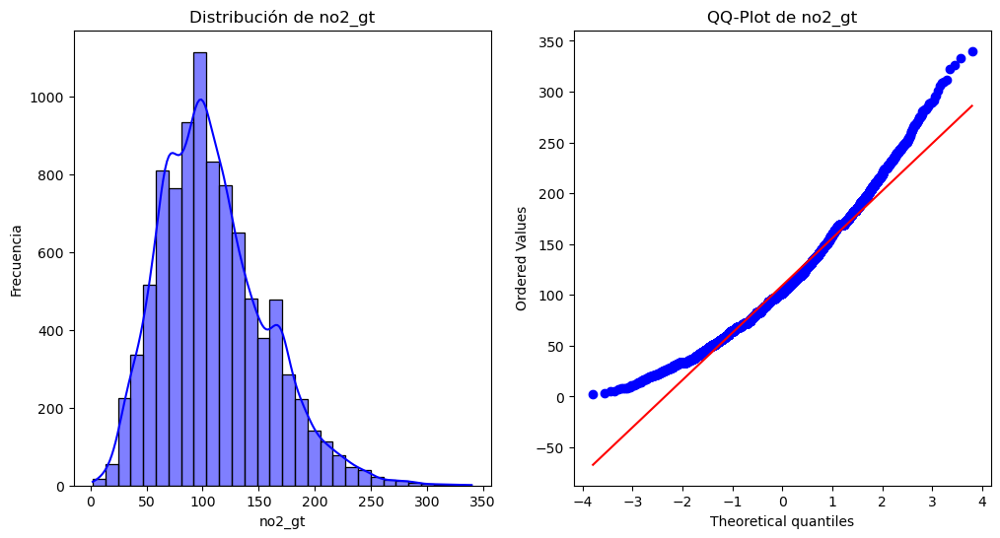

Prueba de Normalidad para: no2_gt
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.97246, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 64.92856
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.99979, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_____________

### Variable pt08_s4_no2

-------------------------------------------------------------------------------------------------------


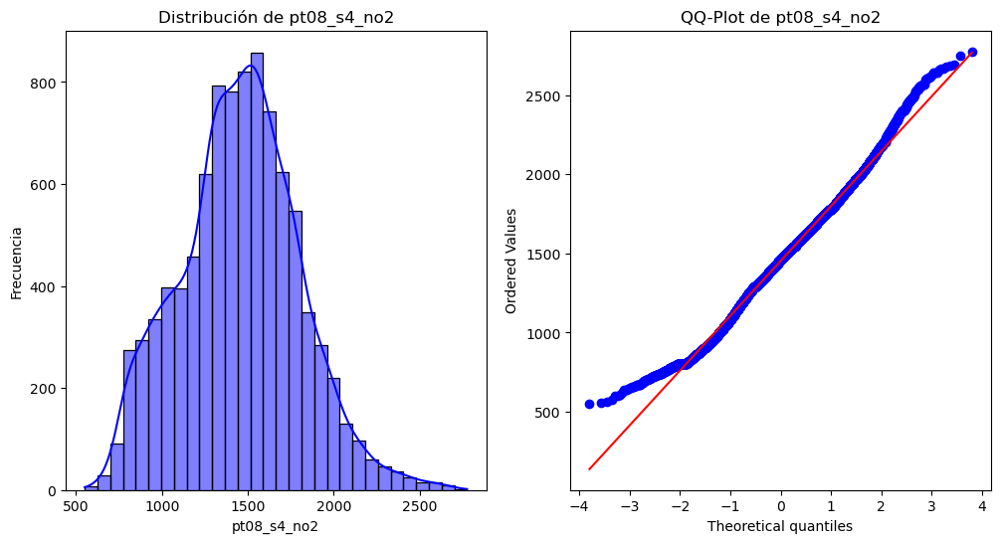

Prueba de Normalidad para: pt08_s4_no2
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.99297, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 7.81887
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_________

### Variable pt08_s5_o3

-------------------------------------------------------------------------------------------------------


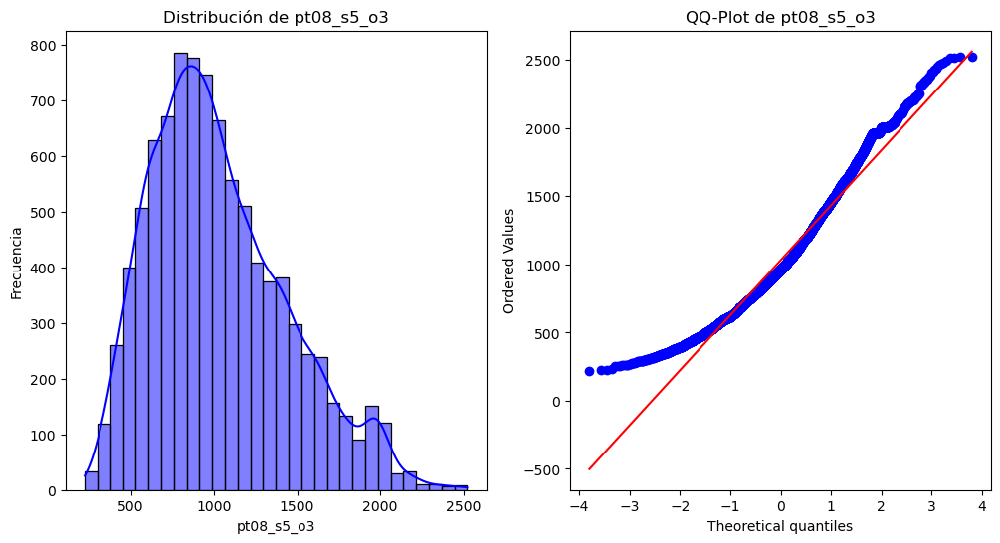

Prueba de Normalidad para: pt08_s5_o3
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.96428, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 88.46625
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_________

### Variable t

-------------------------------------------------------------------------------------------------------


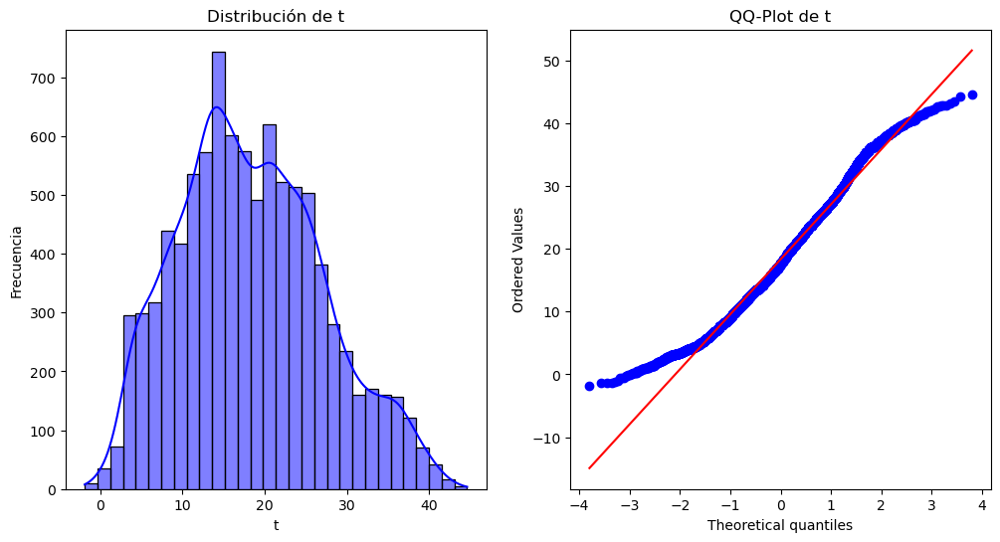

Prueba de Normalidad para: t
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.98514, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 27.88943
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.98494, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
__________________

### Variable rh

-------------------------------------------------------------------------------------------------------


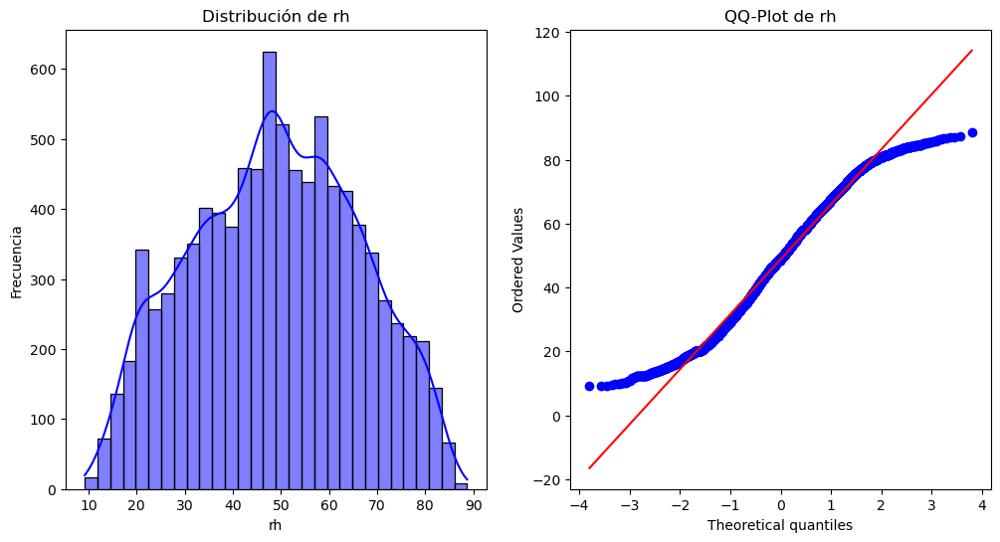

Prueba de Normalidad para: rh
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.98435, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 25.67877
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 1.00000, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_________________

### Variable ah

-------------------------------------------------------------------------------------------------------


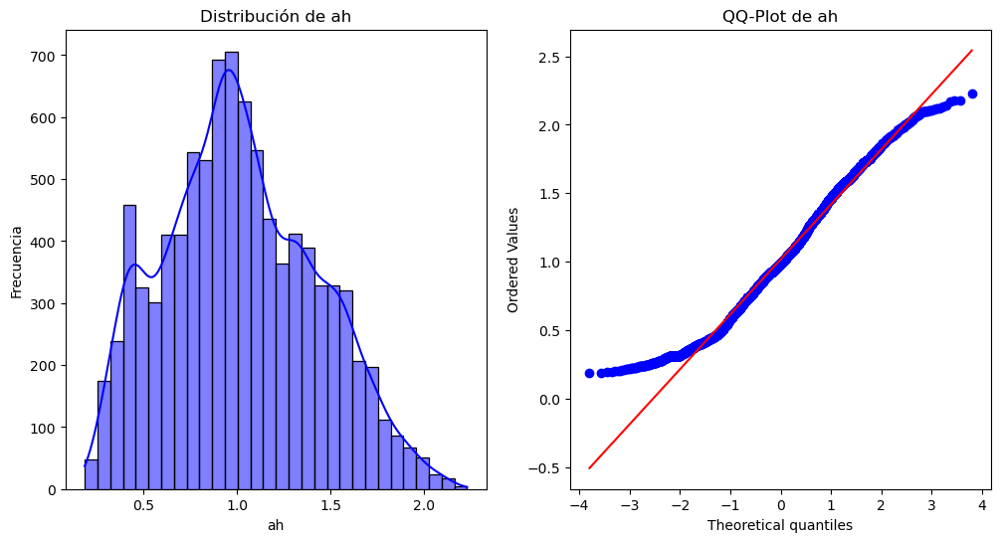

Prueba de Normalidad para: ah
	Prueba de Shapiro-Wilk (p<=0.05): p-value: 0.00000, valor: 0.98578, evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
	Prueba de Anderson-Darling: valor: 26.77051
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
			Al nivel de significancia aplha de 15.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 10.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 5.0%, los datos NO parecen normales.
			Al nivel de significancia aplha de 2.5%, los datos NO parecen normales.
			Al nivel de significancia aplha de 1.0%, los datos NO parecen normales.
	Prueba de Kolmogorov-Smirnov (p<=0.05): p-value: 0.00000, valor: 0.60745, evaluación: , evaluación: Se rechaza la H0
		H0: La muestra viene de una distribución normal.
		Ha: La muestra no viene de una distribución normal.
_________________

In [197]:
display(Markdown("## Pruebas de normalidad"))
for column in numeric_columns:
    display(Markdown(f"### Variable {column}"))
    print("-------------------------------------------------------------------------------------------------------")
    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True, color="blue", bins=30)
    plt.title(f'Distribución de {column}', fontsize=12)
    plt.ylabel("Frecuencia", fontsize=10)
    plt.xlabel(column, fontsize=10)
    
    plt.subplot(1, 2, 2)
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f'QQ-Plot de {column}', fontsize=12)
    
    plt.show()
    
    print(f"Prueba de Normalidad para: {column}")
    
    stest = stats.shapiro(df[column].sample(min(5000, len(df[column])), random_state=random_state)) # se limita a 5000 por warning de librería
    print(f"\tPrueba de Shapiro-Wilk (p<=0.05): p-value: {stest.pvalue:.5f}, valor: {stest.statistic:.5f}, evaluación: {SE_RECHAZA_H0 if stest.pvalue <= 0.05 else NO_SE_RECHAZA_H0}") 
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    atest = stats.anderson(df[column], dist='norm')
    print(f"\tPrueba de Anderson-Darling: valor: {atest.statistic:.5f}")
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    for i in range(len(atest.critical_values)):
        sl, cv = atest.significance_level[i], atest.critical_values[i]
        if atest.statistic < cv:
            print(f"\t\t\tAl nivel de significancia aplha de {sl}%, los datos parecen normales.")
        else:
            print(f"\t\t\tAl nivel de significancia aplha de {sl}%, los datos NO parecen normales.")
    
    ktest = stats.kstest(df[column], 'norm')
    print(f"\tPrueba de Kolmogorov-Smirnov (p<=0.05): p-value: {ktest.pvalue:.5f}, valor: {ktest.statistic:.5f}, evaluación: , evaluación: {SE_RECHAZA_H0 if ktest.pvalue <= 0.05 else NO_SE_RECHAZA_H0}")
    print("\t\tH0: La muestra viene de una distribución normal.")
    print("\t\tHa: La muestra no viene de una distribución normal.")
    
    print("_______________________________________________________________________________________________________")